AGE AND GENDER PREDICTION

IMPORTING NECESSARY LIBRARIES

In [17]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
import seaborn as sns
import random

import cv2

In [3]:
pwd = os.getcwd()

PRE PROCESSING

In [10]:
dataset_path = pwd + "\\UTKFace - Copy"

In [12]:
# Firstly, our dataset has .chip extension at the end which we want to get rid of

# Iterate over all files in the directory
for filename in os.listdir(dataset_path):
    # Check if the filename contains ".chip"
    if ".chip" in filename:
        # Construct the old and new file paths
        old_filepath = os.path.join(dataset_path, filename)
        new_filename = filename.replace(".chip", "")  # Remove ".chip" from the filename
        new_filepath = os.path.join(dataset_path, new_filename)
        
        # Rename the file
        os.rename(old_filepath, new_filepath)
        
        # Print the renaming operation
        print(f"Renamed {old_filepath} to {new_filepath}")


Renamed c:\Users\sweek\OneDrive - Lambton College\Projects Main\Age and Gender Prediction\UTKFace - Copy\100_0_0_20170112213500903.jpg.chip.jpg to c:\Users\sweek\OneDrive - Lambton College\Projects Main\Age and Gender Prediction\UTKFace - Copy\100_0_0_20170112213500903.jpg.jpg
Renamed c:\Users\sweek\OneDrive - Lambton College\Projects Main\Age and Gender Prediction\UTKFace - Copy\100_0_0_20170112215240346.jpg.chip.jpg to c:\Users\sweek\OneDrive - Lambton College\Projects Main\Age and Gender Prediction\UTKFace - Copy\100_0_0_20170112215240346.jpg.jpg
Renamed c:\Users\sweek\OneDrive - Lambton College\Projects Main\Age and Gender Prediction\UTKFace - Copy\100_1_0_20170110183726390.jpg.chip.jpg to c:\Users\sweek\OneDrive - Lambton College\Projects Main\Age and Gender Prediction\UTKFace - Copy\100_1_0_20170110183726390.jpg.jpg
Renamed c:\Users\sweek\OneDrive - Lambton College\Projects Main\Age and Gender Prediction\UTKFace - Copy\100_1_0_20170112213001988.jpg.chip.jpg to c:\Users\sweek\OneD

In [13]:
# Then we got ".jpg.jpg" as extensions, remove one .jpg

for filename in os.listdir(dataset_path):
    new_filename = filename.replace(".jpg.jpg", ".jpg")
    if new_filename != filename:
        old_filepath = os.path.join(dataset_path, filename)
        new_filepath = os.path.join(dataset_path, new_filename)
        os.rename(old_filepath, new_filepath)
        print(f"Renamed {old_filepath} to {new_filepath}")

Renamed c:\Users\sweek\OneDrive - Lambton College\Projects Main\Age and Gender Prediction\UTKFace - Copy\100_0_0_20170112213500903.jpg.jpg to c:\Users\sweek\OneDrive - Lambton College\Projects Main\Age and Gender Prediction\UTKFace - Copy\100_0_0_20170112213500903.jpg
Renamed c:\Users\sweek\OneDrive - Lambton College\Projects Main\Age and Gender Prediction\UTKFace - Copy\100_0_0_20170112215240346.jpg.jpg to c:\Users\sweek\OneDrive - Lambton College\Projects Main\Age and Gender Prediction\UTKFace - Copy\100_0_0_20170112215240346.jpg
Renamed c:\Users\sweek\OneDrive - Lambton College\Projects Main\Age and Gender Prediction\UTKFace - Copy\100_1_0_20170110183726390.jpg.jpg to c:\Users\sweek\OneDrive - Lambton College\Projects Main\Age and Gender Prediction\UTKFace - Copy\100_1_0_20170110183726390.jpg
Renamed c:\Users\sweek\OneDrive - Lambton College\Projects Main\Age and Gender Prediction\UTKFace - Copy\100_1_0_20170112213001988.jpg.jpg to c:\Users\sweek\OneDrive - Lambton College\Projects 

In [14]:
# Corrected filenames

filenames = os.listdir(dataset_path)
print(filenames[0])

100_0_0_20170112213500903.jpg


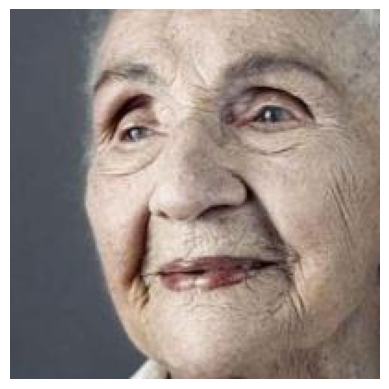

In [15]:
# Taking a look at our image

image_path = os.path.join(dataset_path, filenames[3])
image = Image.open(image_path)

plt.imshow(image)
plt.axis("off")
plt.show()

In [20]:
# Our files have age and gender information in the filenames, extracting the info

gender_list = []
age_list = []
image_paths = []

for filename in os.listdir(dataset_path):
    image_path = os.path.join(dataset_path, filename)
    temp = filename.split("_")
    gender_list.append(int(temp[1]))
    age_list.append(int(temp[0]))
    image_paths.append(image_path)

In [21]:
df = pd.DataFrame()
df['image'], df['gender_index'], df['age'] = image_paths, gender_list, age_list
df.head()

,image,gender_index,age
0,c:\Users\sweek\OneDrive - Lambton College\Proj...,0,100
1,c:\Users\sweek\OneDrive - Lambton College\Proj...,0,100
2,c:\Users\sweek\OneDrive - Lambton College\Proj...,0,100
3,c:\Users\sweek\OneDrive - Lambton College\Proj...,0,100
4,c:\Users\sweek\OneDrive - Lambton College\Proj...,1,100


In [22]:
gender_dict = df['gender_index'].replace({0:"Male",1:"Female"})
df["gender"] = df['gender_index'].replace({0:"Male",1:"Female"})

In [25]:
df.head()

,image,gender_index,age,gender
0,c:\Users\sweek\OneDrive - Lambton College\Proj...,0,100,Male
1,c:\Users\sweek\OneDrive - Lambton College\Proj...,0,100,Male
2,c:\Users\sweek\OneDrive - Lambton College\Proj...,0,100,Male
3,c:\Users\sweek\OneDrive - Lambton College\Proj...,0,100,Male
4,c:\Users\sweek\OneDrive - Lambton College\Proj...,1,100,Female


In [28]:
df.to_csv("dataset.csv", index=False)

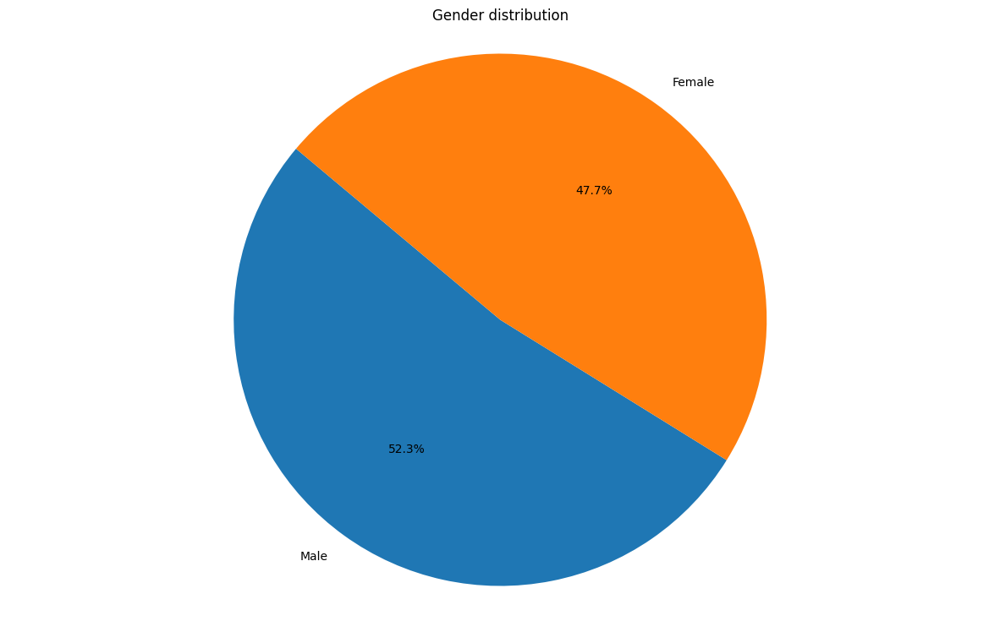

In [29]:
# View gender information

genders = df['gender'].value_counts()

plt.figure(figsize=(15, 9))
plt.pie(genders, labels=genders.index, autopct='%1.1f%%', startangle=140)
plt.title("Gender distribution")
plt.axis("equal")
plt.plot();


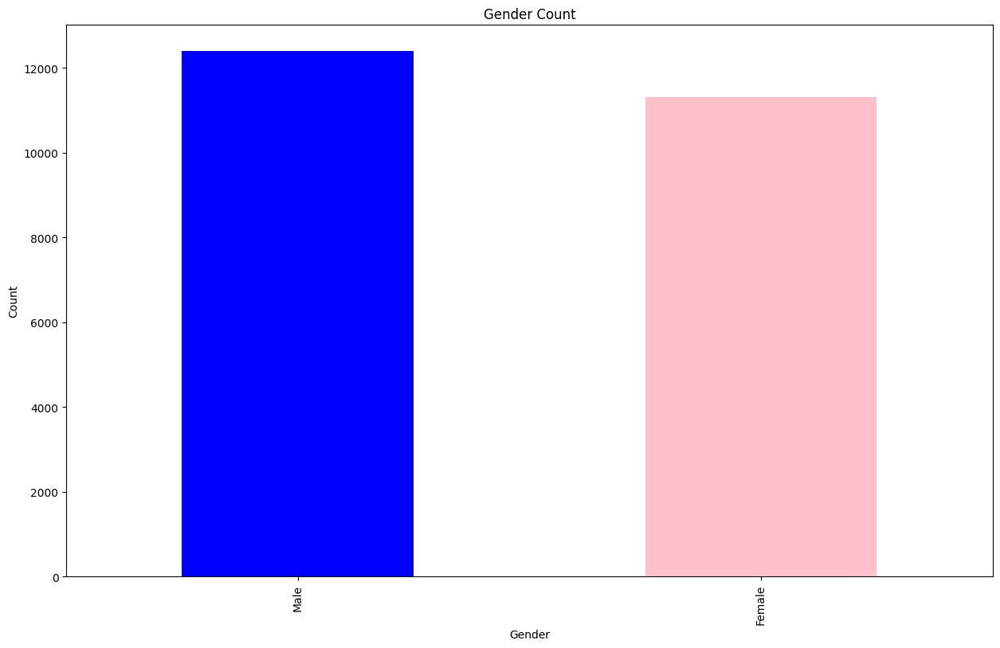

In [30]:
plt.figure(figsize=(15,9))
genders.plot(kind="bar", color=["blue", 'pink'])
plt.title("Gender Count")
plt.xlabel("Gender")
plt.ylabel("Count")
plt.plot();

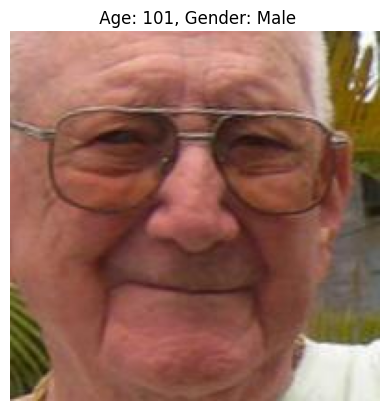

In [33]:
img = Image.open(df['image'][13])
plt.title(f' Age: {df.age[13]}, Gender: {df.gender[13]}')
plt.axis('off')
plt.imshow(img);